# 商务案例: 餐饮业时空数据挖掘
# 1. 前言
## 1.1. 数据介绍
**yelp**数据集整理自官方公开 (https://www.yelp.com/dataset) 的商户、点评和用户数据。整理好的Yelp数据集包含位于多伦多的所有餐馆信息(biz_res.txt)、所有餐馆截至2017年7月的评论数据(review_res.txt)及所有相关用户个人信息(user_res.txt)。
各文件的数据字段名称详见ReadMe.txt，数据字段含义详见Yelp Dataset JSON.pdf。

## 1.2. 案例结构

本案例主要分成两部分，第一部分演示餐馆和用户的聚类分析，第二部分展示餐馆推荐的基础算法。

第一部分: loc_clu_case_study_\*.ipynb
- 1.餐馆数据可视化 
- 2.用户数据可视化
- 3.餐馆聚类分析
- 4.用户聚类分析
    
第二部分:loc_rec_case_study_\*.ipynb
- 1.基于Yelp数据的餐馆推荐-基于热度的推荐算法
- 2.基于Yelp数据的餐馆推荐-基于KNN的推荐算法
- 3.基于Yelp数据的餐馆推荐-基于BPR的推荐算法

In [1]:
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt

## 餐馆数据可视化
### 0. 加载餐馆数据集

In [2]:
# 加载biz数据集，将txt转换为csv格式，存入biz_data文件中

csvFile = open("./data/biz_data.csv", 'w', newline = '', encoding = 'utf-8')
writer = csv.writer(csvFile)
csvRow = []

f = open("./sample/biz_res.txt", 'r', encoding = 'UTF-8')
for line in f:
    line = line.rstrip('\n')   #移除行尾换行符
    csvRow = line.split('\t')
    writer.writerow(csvRow)

f.close()
csvFile.close()

In [3]:
## 读取biz数据集

biz_data = pd.read_csv("./data/biz_data.csv")
print ("Number of restaurants: ", biz_data.shape[0])
biz_data.head()

Number of restaurants:  6750


,business_id,name,neighborhood,address,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,qim0lD112TkDhm8ZyQlRnA,McCarthy's Irish Pub,Upper Beach,1801 Gerrard Street E,M4L 2B5,43.678049,-79.314774,4.0,5,0,"Pubs,Bars,Irish,Nightlife"
1,Wf5C8Amv_SlhoYE3_W66WQ,Oishi Sushi,NaN,1325 Finch Ave W,M3J 2G5,43.763510,-79.490750,2.0,27,0,"Asian Fusion,Sushi Bars"
2,Z1r6b30Tg0n0ME4-Zj2wQQ,Boardwalk Place,NaN,1675 Lake Shore Boulevard E,M4W 3L6,43.663010,-79.310898,3.0,13,1,"American (Traditional),Bars,Pubs,Beer,Wine & S..."
3,oMcKvfNGX2HleFxYg1VGqg,Buonanotte,Entertainment District,19 Mercer Street,M5V 1H2,43.645687,-79.390493,2.0,66,1,Italian
4,kLw_FmSiEqYH-MtFhDIUFQ,Big Daddy's Bourbon Street Bistro & Oyster Bar,Entertainment District,212 King Street W,M5H 1K5,43.647499,-79.386471,3.5,132,0,"Cajun/Creole,Seafood"


###  1. 数据处理
- 查看缺失值：属性latitude、longitude无缺失值，对餐馆可视化没有影响，暂时不需要处理

In [4]:
## 获取每一列（属性）的缺失情况

missing_values_count = biz_data.isnull().sum()
print(missing_values_count)

business_id        0
name               0
neighborhood    1142
address           14
postal_code       16
latitude           0
longitude          0
stars              0
review_count       0
is_open            0
categories        12
dtype: int64


### 2. 餐馆可视化
- 根据多伦多经纬度创建地图；
- 从biz_data数据集中选择属性latitude、longitude来生成每个餐馆的地理位置信息；
- 将餐馆的位置展示在地图上；

In [5]:
#!pip install folium
import folium
import os
from folium import plugins

In [6]:
world_map = folium.Map()
world_map

In [7]:
# 多伦多经纬度（调整过）
latitude = 43.66
longitude = -79.38

# 创建地图并展示
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map

In [8]:
# 按餐馆的经纬度进行可视化

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitudes = list(biz_data.latitude)    #餐馆的纬度
longitudes = list(biz_data.longitude)  # 餐馆的经度


for lat, lng, in zip(latitudes, longitudes):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 5,  
            color = 'yellow',
            fill = True,
            fill_color = 'red',
            fill_opacity = 0.4
        )
    )
    
# Add incidents to map
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map.add_child(incidents)

In [9]:
# 重新创建一个地图
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(trt_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, in zip(biz_data.latitude, biz_data.longitude):
    folium.Marker(location=[lat, lng]).add_to(incidents)

# add incidents to map
trt_map.add_child(incidents)

In [10]:
# 餐馆热力图
#!pip install gmplot
# plot the locations on google map
import gmplot             

# Initialize the map 
gmap = gmplot.GoogleMapPlotter(latitude, longitude, 12)

gmap.heatmap(latitudes, longitudes)

gmap.draw("./biz_heatmap.html")

In [13]:
from PyQt5.QtWidgets import QApplication
from PyQt5.QtWebEngineWidgets import QWebEngineView
from PyQt5.QtCore import QUrl

# 保存并展示热力图
app = QApplication([])
view = QWebEngineView()
view.load(QUrl("./biz_heatmap.html"))
view.show()
app.exec_()

0

1.0      23
1.5     106
2.0     339
2.5     623
3.0    1401
3.5    1854
4.0    1628
4.5     639
5.0     137
Name: stars, dtype: int64


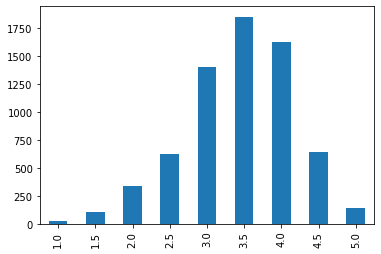

In [14]:
#根据餐馆的stars得分进行分类统计

biz_data_stars_count = biz_data["stars"].value_counts().sort_index()   
print(biz_data_stars_count)

biz_data_stars_count.plot.bar()
plt.show()

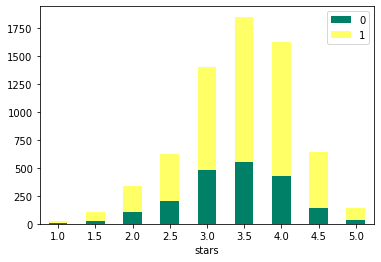

In [15]:
crosssalary = pd.crosstab(biz_data['stars'], biz_data['is_open'])
 
crosssalary.columns = ['0','1']  # 0代表没有open的餐馆，1代表open的餐馆
crosssalary.plot.bar(rot = 0, colormap = 'summer', stacked = True)

In [16]:
# 展示stars=3.5的餐馆的位置分布

stars35_data = biz_data[biz_data["stars"] == 3.5]

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitudes = list(stars35_data.latitude)
longitudes = list(stars35_data.longitude)


for lat, lng, in zip(latitudes, longitudes):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 5,  
            color = 'yellow',
            fill = True,
            fill_color = 'red',
            fill_opacity = 0.4
        )
    )
    
# Add incidents to map
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map.add_child(incidents)

In [17]:
# 展示stars=5的餐馆的位置分布

stars50_data = biz_data[biz_data["stars"] == 5]

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitudes = list(stars50_data.latitude)
longitudes = list(stars50_data.longitude)

for lat, lng  in zip(latitudes, longitudes):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 5,  
            color = 'orange',
            fill = True,
            fill_color = 'red',
            fill_opacity = 0.4
        )
    )
    
# Add incidents to map
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map.add_child(incidents)

In [18]:
# 展示stars=1的餐馆的位置分布

stars10_data = biz_data[biz_data["stars"] == 1]

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitudes = list(stars10_data.latitude)
longitudes = list(stars10_data.longitude)

for lat, lng, in zip(latitudes, longitudes):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 5,  
            color = 'grey',
            fill = True,
            fill_color = 'grey',
            fill_opacity = 0.4
        )
    )
    
# Add incidents to map
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map.add_child(incidents)

1    4768
0    1982
Name: is_open, dtype: int64


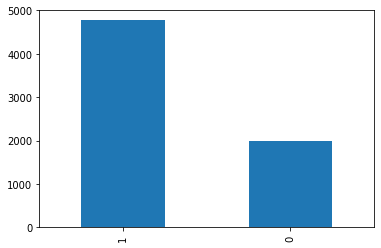

In [19]:
#统计餐馆open的情况

biz_data_open_count = biz_data["is_open"].value_counts()    
print(biz_data_open_count)

biz_data_open_count.plot.bar()
plt.show()

In [20]:
# 根据餐馆开门情况进行展示，灰色代表关闭，黄色代表开门

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

latitudes = list(biz_data.latitude)
longitudes = list(biz_data.longitude)
is_open= list(biz_data.is_open)

for lat, lng, _is_open, in zip(latitudes, longitudes,is_open):
    if _is_open == 1:
        incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 4,  
            color = 'yellow',
            fill = True,
            fill_opacity = 0.4
        )
    )
    else:
        incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius = 4,  
            color = 'grey',
            fill = True,
            fill_opacity = 0.4
        )
    )
    
    
# Add incidents to map
trt_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
trt_map.add_child(incidents)